In [6]:
import io
import os
import scipy.misc
import numpy as np
import six
import time

from six import BytesIO

import matplotlib
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont

import tensorflow as tf
import tensorflow_hub as hub
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import label_map_util

tf.gfile = tf.io.gfile

%matplotlib inline

In [7]:
class ObjectDetection:
    def __init__(self):
        PATH_TO_LABELS = 'models/research/object_detection/data/mscoco_label_map.pbtxt'
        self.category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)
        
        tf.keras.backend.clear_session()
#         self.detect_fn = tf.saved_model.load('models/research/object_detection/test_data/efficientdet_d5_coco17_tpu-32/saved_model')
        
        ALL_MODELS = {
        'CenterNet HourGlass104 512x512' : 'https://tfhub.dev/tensorflow/centernet/hourglass_512x512/1',
        'CenterNet HourGlass104 Keypoints 512x512' : 'https://tfhub.dev/tensorflow/centernet/hourglass_512x512_kpts/1',
        'CenterNet HourGlass104 1024x1024' : 'https://tfhub.dev/tensorflow/centernet/hourglass_1024x1024/1',
        'CenterNet HourGlass104 Keypoints 1024x1024' : 'https://tfhub.dev/tensorflow/centernet/hourglass_1024x1024_kpts/1',
        'CenterNet Resnet50 V1 FPN 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v1_fpn_512x512/1',
        'CenterNet Resnet50 V1 FPN Keypoints 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v1_fpn_512x512_kpts/1',
        'CenterNet Resnet101 V1 FPN 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet101v1_fpn_512x512/1',
        'CenterNet Resnet50 V2 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v2_512x512/1',
        'CenterNet Resnet50 V2 Keypoints 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v2_512x512_kpts/1',
        'EfficientDet D0 512x512' : 'https://tfhub.dev/tensorflow/efficientdet/d0/1',
        'EfficientDet D1 640x640' : 'https://tfhub.dev/tensorflow/efficientdet/d1/1',
        'EfficientDet D2 768x768' : 'https://tfhub.dev/tensorflow/efficientdet/d2/1',
        'EfficientDet D3 896x896' : 'https://tfhub.dev/tensorflow/efficientdet/d3/1',
        'EfficientDet D4 1024x1024' : 'https://tfhub.dev/tensorflow/efficientdet/d4/1',
        'EfficientDet D5 1280x1280' : 'https://tfhub.dev/tensorflow/efficientdet/d5/1',
        'EfficientDet D6 1280x1280' : 'https://tfhub.dev/tensorflow/efficientdet/d6/1',
        'EfficientDet D7 1536x1536' : 'https://tfhub.dev/tensorflow/efficientdet/d7/1',
        'SSD MobileNet v2 320x320' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/2',
        'SSD MobileNet V1 FPN 640x640' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v1/fpn_640x640/1',
        'SSD MobileNet V2 FPNLite 320x320' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/fpnlite_320x320/1',
        'SSD MobileNet V2 FPNLite 640x640' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/fpnlite_640x640/1',
        'SSD ResNet50 V1 FPN 640x640 (RetinaNet50)' : 'https://tfhub.dev/tensorflow/retinanet/resnet50_v1_fpn_640x640/1',
        'SSD ResNet50 V1 FPN 1024x1024 (RetinaNet50)' : 'https://tfhub.dev/tensorflow/retinanet/resnet50_v1_fpn_1024x1024/1',
        'SSD ResNet101 V1 FPN 640x640 (RetinaNet101)' : 'https://tfhub.dev/tensorflow/retinanet/resnet101_v1_fpn_640x640/1',
        'SSD ResNet101 V1 FPN 1024x1024 (RetinaNet101)' : 'https://tfhub.dev/tensorflow/retinanet/resnet101_v1_fpn_1024x1024/1',
        'SSD ResNet152 V1 FPN 640x640 (RetinaNet152)' : 'https://tfhub.dev/tensorflow/retinanet/resnet152_v1_fpn_640x640/1',
        'SSD ResNet152 V1 FPN 1024x1024 (RetinaNet152)' : 'https://tfhub.dev/tensorflow/retinanet/resnet152_v1_fpn_1024x1024/1',
        'Faster R-CNN ResNet50 V1 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_640x640/1',
        'Faster R-CNN ResNet50 V1 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_1024x1024/1',
        'Faster R-CNN ResNet50 V1 800x1333' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_800x1333/1',
        'Faster R-CNN ResNet101 V1 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_640x640/1',
        'Faster R-CNN ResNet101 V1 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_1024x1024/1',
        'Faster R-CNN ResNet101 V1 800x1333' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_800x1333/1',
        'Faster R-CNN ResNet152 V1 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_640x640/1',
        'Faster R-CNN ResNet152 V1 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_1024x1024/1',
        'Faster R-CNN ResNet152 V1 800x1333' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_800x1333/1',
        'Faster R-CNN Inception ResNet V2 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_640x640/1',
        'Faster R-CNN Inception ResNet V2 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_1024x1024/1',
        'Mask R-CNN Inception ResNet V2 1024x1024' : 'https://tfhub.dev/tensorflow/mask_rcnn/inception_resnet_v2_1024x1024/1'
        }
        model_display_name = 'CenterNet HourGlass104 Keypoints 512x512' # @param ['CenterNet HourGlass104 512x512','CenterNet HourGlass104 Keypoints 512x512','CenterNet HourGlass104 1024x1024','CenterNet HourGlass104 Keypoints 1024x1024','CenterNet Resnet50 V1 FPN 512x512','CenterNet Resnet50 V1 FPN Keypoints 512x512','CenterNet Resnet101 V1 FPN 512x512','CenterNet Resnet50 V2 512x512','CenterNet Resnet50 V2 Keypoints 512x512','EfficientDet D0 512x512','EfficientDet D1 640x640','EfficientDet D2 768x768','EfficientDet D3 896x896','EfficientDet D4 1024x1024','EfficientDet D5 1280x1280','EfficientDet D6 1280x1280','EfficientDet D7 1536x1536','SSD MobileNet v2 320x320','SSD MobileNet V1 FPN 640x640','SSD MobileNet V2 FPNLite 320x320','SSD MobileNet V2 FPNLite 640x640','SSD ResNet50 V1 FPN 640x640 (RetinaNet50)','SSD ResNet50 V1 FPN 1024x1024 (RetinaNet50)','SSD ResNet101 V1 FPN 640x640 (RetinaNet101)','SSD ResNet101 V1 FPN 1024x1024 (RetinaNet101)','SSD ResNet152 V1 FPN 640x640 (RetinaNet152)','SSD ResNet152 V1 FPN 1024x1024 (RetinaNet152)','Faster R-CNN ResNet50 V1 640x640','Faster R-CNN ResNet50 V1 1024x1024','Faster R-CNN ResNet50 V1 800x1333','Faster R-CNN ResNet101 V1 640x640','Faster R-CNN ResNet101 V1 1024x1024','Faster R-CNN ResNet101 V1 800x1333','Faster R-CNN ResNet152 V1 640x640','Faster R-CNN ResNet152 V1 1024x1024','Faster R-CNN ResNet152 V1 800x1333','Faster R-CNN Inception ResNet V2 640x640','Faster R-CNN Inception ResNet V2 1024x1024','Mask R-CNN Inception ResNet V2 1024x1024']
        model_handle = ALL_MODELS[model_display_name]
    
        self.detect_fn = hub_model = hub.load(model_handle)

    def inference(self, image_np, logging=False):
        detections = self.detect_fn(image_np)
        detections = {key:value.numpy() for key,value in detections.items()}

        if logging:
            label_id_offset = 0
            image_np_with_detections = image_np.copy()
            viz_utils.visualize_boxes_and_labels_on_image_array(
                image_np_with_detections[0],
                detections['detection_boxes'][0],
                (detections['detection_classes'][0] + label_id_offset).astype(int),
                detections['detection_scores'][0],
                self.category_index,
                use_normalized_coordinates=True,
                max_boxes_to_draw=200,
                min_score_thresh=.30,
                agnostic_mode=False)

            plt.figure(figsize=(24,32))
            plt.imshow(image_np_with_detections[0])
            plt.show()

        return detections
        

In [8]:
from quickdraw import QuickDrawData
import IPython
import os
import json
import random
import json
import cv2
import matplotlib.pyplot as plt
import numpy as np
import requests
from io import BytesIO
import base64
from math import trunc
from PIL import Image as PILImage
from PIL import ImageDraw as PILImageDraw
from pycocotools.coco import COCO
import numpy as np
import skimage.io as io
import matplotlib.pyplot as plt
import pylab

In [25]:
class QuickDrawDataset:
    def __init__(self):
        self.qd = QuickDrawData()
        self.coco_to_quickdraw = {
            "pizza": "pizza",
            "bus": "bus",
            "couch": "couch",
            "remote": "key",
            "snowboard": "skateboard",
            "fork": "fork",
            "suitcase": "suitcase",
            "scissors": "scissors",
            "sheep": "sheep",
#             "person": "scorpion",
            "person": "duck",
            "dog": "dog", 
            "cake": "cake",
            "tv": "television",
            "frisbee": "baseball",
            "carrot": "carrot",
            "bird": "bird",
            "bicycle": "bicycle",
            "cow": "cow",
            "cat": "cat",
            "bowl": "bathtub",
            "book": "book",
            "tie": "bowtie",
            "sink": "sink",
            "toothbrush": "toothbrush",
            "bed": "bed",
            "bear": "bear",
            "skateboard": "skateboard",
            "train": "train",
            "backpack": "backpack",
            "cup": "cup",
            "bottle": "wine bottle",
            "car": "car",
            "laptop": "laptop",
            "elephant": "elephant",
            "bench": "bench",
            "knife": "knife",
            "zebra": "zebra",
            "orange": "apple",
            "donut": "donut",
            "apple": "apple",
            "chair": "chair",
            "toilet": "toilet",
            "banana": "banana",
            "airplane": "airplane",
            "giraffe": "giraffe",
            "refrigerator": "cooler",
            "broccoli": "broccoli", 
            "clock": "clock", 
            "spoon": "fork", 
            "handbag": "purse", 
            "horse": "horse", 
            "toaster": "toaster", 
            "microwave": "microwave", 
            "motorcycle": "motorbike", 
            "vase": "vase", 
            "keyboard": "keyboard", 
            "skis": "lollipop", 
            "oven": "oven", 
            "kite": "postcard", 
            "surfboard": "skateboard", 
            "sandwich": "sandwich", 
            "truck": "truck", 
            "boat": "speedboat", 
            "umbrella": "umbrella", 
            "mouse": "mouse", 
            "traffic light": "traffic light", 
            "fire hydrant": "fire hydrant", 
            "stop sign": "stop sign", 
            "parking meter": "sword", 
            "sports ball": "soccer ball", 
            "baseball bat": "baseball bat", 
            "baseball glove": "hand", 
            "tennis racket": "tennis racquet", 
            "wine glass": "wine glass", 
            "hot dog": "hot dog", 
            "potted plant": "house plant", 
            "dining table": "table", 
            "cell phone": "cell phone", 
            "teddy bear": "teddy-bear", 
            "hair dryer": "drill" }
        PATH_TO_LABELS = 'models/research/object_detection/data/mscoco_label_map.pbtxt'
        self.category_index = label_map_util.create_category_index_from_labelmap(
            PATH_TO_LABELS, use_display_name=True)

    # Removes detections that either do not have a quickdraw equivalent annotations or have a score
    # below the threshold.
    def prune_detections(self, image_shape, detections, threshold):
        pruned_detections = []
        for i in range(int(detections['num_detections'][0])):
            if ((self.category_index[detections['detection_classes'][0][i]]['name'] in self.coco_to_quickdraw) and
                (detections['detection_scores'][0][i] > threshold)):
                quickdraw_class = self.coco_to_quickdraw[self.category_index[detections['detection_classes'][0][i]]['name']]
                old_bbox = detections['detection_boxes'][0][i]
                new_bbox = [old_bbox[1] * image_shape[1],
                            old_bbox[0] * image_shape[0],
                            (old_bbox[3]-old_bbox[1]) * image_shape[1],
                            (old_bbox[2]-old_bbox[0]) * image_shape[0]]
                pruned_detections.append({'class': quickdraw_class,'bbox': new_bbox})
    
        return pruned_detections
            
    def draw(self, image, detections, save_filename):
        I = image.copy()
        for detection in detections:
            
            plt.axis('off')
            print('is this actually working?')

            [bbox_x, bbox_y, bbox_w, bbox_h] = detection['bbox']

            bbox_x = int(bbox_x)
            bbox_y = int(bbox_y)
            bbox_w = int(bbox_w)
            bbox_h = int(bbox_h)

                
            bbox_image = I[bbox_x:bbox_x+bbox_w, bbox_y:bbox_y+bbox_h]
            edges=cv2.Canny(bbox_image, 150, 200)
            inv = cv2.bitwise_not(edges)

            h, w = np.shape(inv)

            qdg = QuickDrawDataGroup(detection['class'])
            smallest_norm = float('inf')

            closest_drawing = 0

            for drawing in qdg.drawings:
                pix = np.array(drawing.image)
                pixgray = cv2.cvtColor(pix, cv2.COLOR_BGR2GRAY)

                pixgray = cv2.resize(pixgray, (w, h))
                fnorm = np.linalg.norm(pixgray - inv, 'fro')

                if(fnorm < smallest_norm):

                    smallest_norm = fnorm
                    closest_drawing = drawing.key_id

            final = qdg.search_drawings(key_id=closest_drawing)[0]

            width, height = get_quickdraw_dims(final)

            for stroke in final.strokes:
                xarr = []
                yarr = []
                for x, y in stroke:
                    xarr.append(x)
                    yarr.append(y)

                newx = [x * (bbox_w/width) + bbox_x for x in xarr]
                newy = [y * (bbox_h/height) + bbox_y for y in yarr]
                newx = np.rint(newx).astype(int)
                newy = np.rint(newy).astype(int)
                for i in range(0, len(newx) - 1):
                    I = cv2.line(I, (newx[i],newy[i]), (newx[i+1],newy[i+1]), (255, 255, 255) , 2)

            plt.imshow(I)
            plt.show()
                        
#             drawing = self.qd.get_drawing(detection['class'])
#             pil_im = drawing.image


#             plt.axis('off')

#             [bbox_x, bbox_y, bbox_w, bbox_h] = detection['bbox']
#             for stroke in drawing.strokes:
#                 xarr = []
#                 yarr = []
#                 for x, y in stroke:
#                     xarr.append(x)
#                     yarr.append(y)

#                 newx = [x * (bbox_w/width) + bbox_x for x in xarr]
#                 newy = [y * (bbox_h/height) + bbox_y for y in yarr]
#                 plt.plot(newx,newy, marker = ',', color="white")

#         plt.imshow(I)
#         plt.axis('off')
#         plt.savefig(save_filename, bbox_inches='tight', pad_inches=0)
#         plt.show()
        
        return I

In [12]:
object_detection = ObjectDetection()
qd_dataset = QuickDrawDataset()

IMG_0711.jpeg


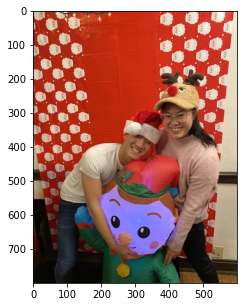

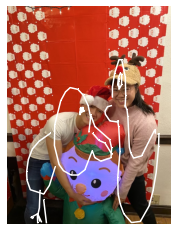

IMG_0969.jpeg


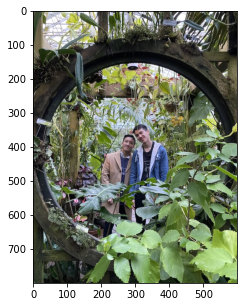

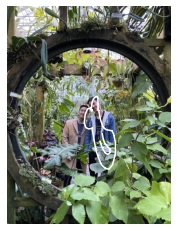

IMG_1206.JPG


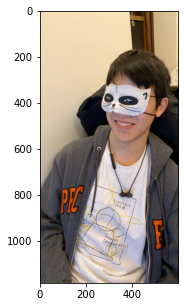

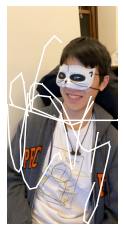

IMG_2208.jpeg


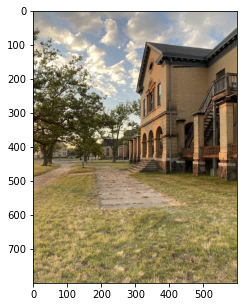

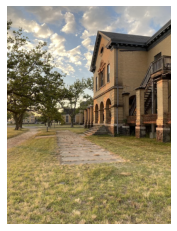

IMG_2531.jpeg


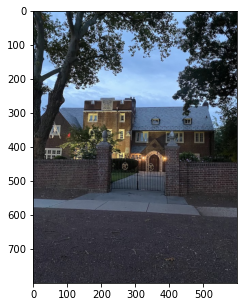

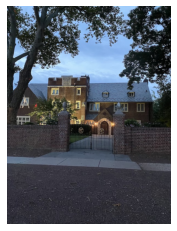

IMG_2629.JPG


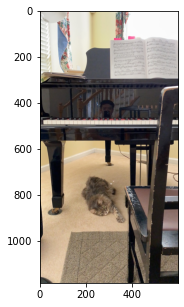

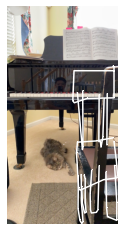

IMG_2838.jpeg


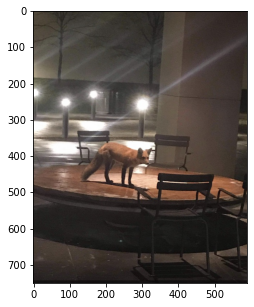

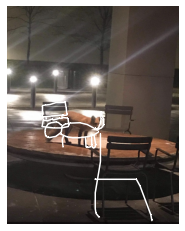

IMG_2884.JPG


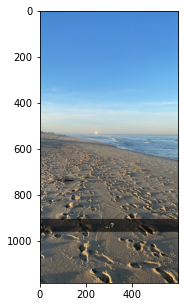

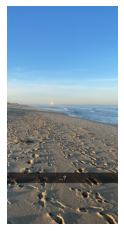

In [26]:
def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.

    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.

    Args:
    path: the file path to the image

    Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
    """
    image = None
    if(path.startswith('http')):
        response = urlopen(path)
        image_data = response.read()
        image_data = BytesIO(image_data)
        image = Image.open(image_data)
    else:
        image_data = tf.io.gfile.GFile(path, 'rb').read()
        image = Image.open(BytesIO(image_data))

    (im_width, im_height) = image.size
    return np.array(image.getdata()).reshape(
          (1, im_height, im_width, 3)).astype(np.uint8)

def evaluate(object_detection, qd_dataset, source_path, sink_path):
    for filename in os.listdir(source_path):
        if filename.endswith(".JPG") or filename.endswith(".PNG") or filename.endswith(".jpeg"):
            print(filename)
            image_np = load_image_into_numpy_array(os.path.join(source_path, filename))
            plt.figure(figsize=(5,5))
            plt.imshow(image_np[0])
            plt.show()
            
            detections = object_detection.inference(image_np, logging=False)
            pruned_detections = qd_dataset.prune_detections(image_np.shape[1:], detections, threshold=0.5)
            drawn_image = qd_dataset.draw(image_np[0], pruned_detections, os.path.join(sink_path, filename))

evaluate(object_detection, qd_dataset, 'test_images', 'test_images_drawn')

Test For Object Detection

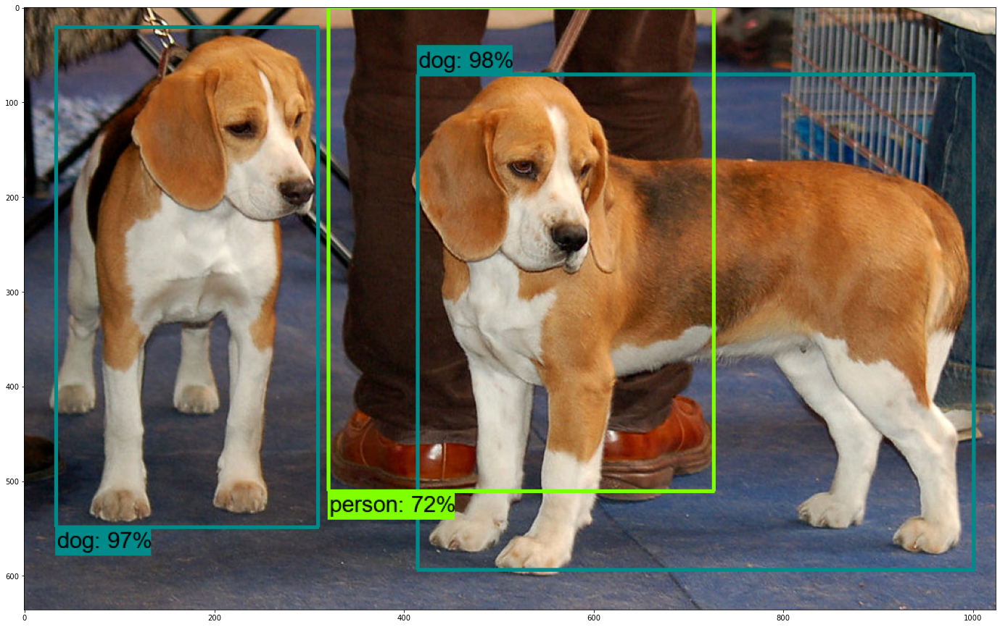

dict_keys(['detection_classes', 'detection_boxes', 'detection_keypoints', 'detection_keypoint_scores', 'num_detections', 'detection_scores'])
[[[1.11675858e-01 4.04584140e-01 9.32699084e-01 9.78349686e-01]
  [3.34391557e-02 3.30845863e-02 8.62610221e-01 3.03220928e-01]
  [0.00000000e+00 3.12650770e-01 8.03356409e-01 7.10444689e-01]
  [1.37341092e-03 5.41105509e-01 2.56057620e-01 7.00193405e-01]
  [3.02611035e-03 7.79482901e-01 7.12622464e-01 9.94029939e-01]
  [3.87424487e-03 9.16725993e-01 7.12542534e-01 9.97598529e-01]
  [0.00000000e+00 1.15091577e-01 1.15643062e-01 2.97688723e-01]
  [0.00000000e+00 1.43565238e-03 4.19212937e-01 1.47183210e-01]
  [2.22598971e-03 4.56161797e-04 1.32152811e-01 1.33491009e-01]
  [6.19924278e-04 7.80698538e-01 4.90827233e-01 9.92045045e-01]
  [0.00000000e+00 1.00880265e-02 1.17511287e-01 3.11037064e-01]
  [7.08563268e-01 2.12714821e-03 7.87491262e-01 4.18329388e-02]
  [0.00000000e+00 7.42129982e-03 1.38152897e-01 3.28044057e-01]
  [3.70628410e-03 7.045893

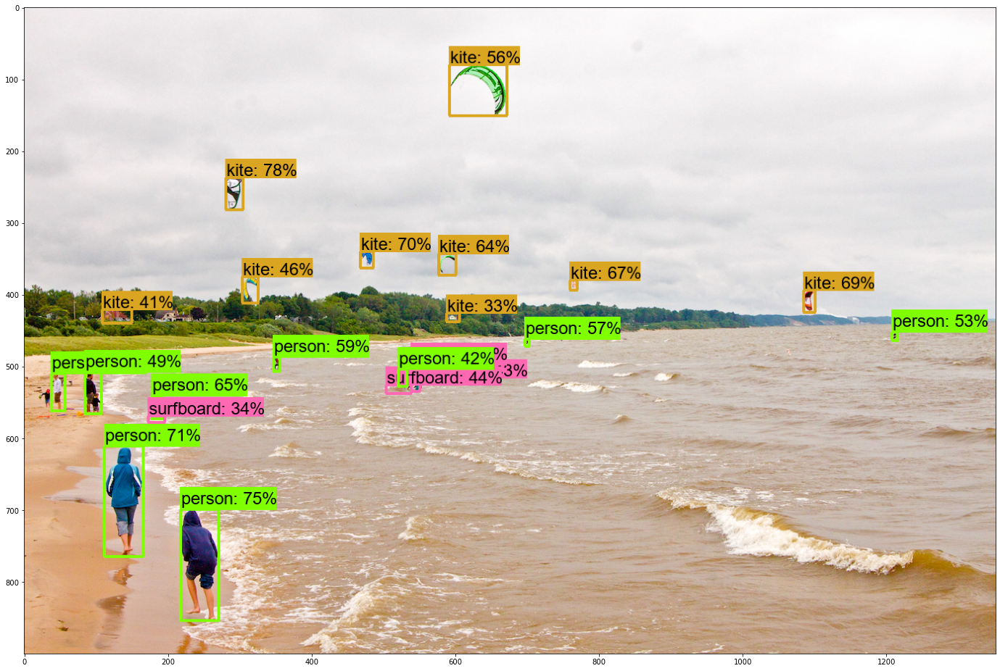

dict_keys(['detection_classes', 'detection_boxes', 'detection_keypoints', 'detection_keypoint_scores', 'num_detections', 'detection_scores'])
[[[0.2643208  0.2075287  0.31309545 0.2260658 ]
  [0.7771376  0.160951   0.9488429  0.2004533 ]
  [0.67923826 0.08259597 0.8499174  0.12335506]
  [0.37808904 0.34561568 0.40276074 0.35999352]
  [0.43852508 0.80208844 0.47138757 0.8146835 ]
  [0.4225424  0.56203616 0.43731675 0.5697473 ]
  [0.60162663 0.13113075 0.6359132  0.1429865 ]
  [0.5674867  0.02776564 0.6233565  0.04252442]
  [0.38130394 0.4262706  0.41372657 0.44455338]
  [0.5420317  0.25657338 0.56274015 0.26342946]
  [0.5138648  0.5154458  0.52426714 0.520098  ]
  [0.08934798 0.43770233 0.16725671 0.4973438 ]
  [0.50271374 0.8928056  0.5144784  0.89944553]
  [0.5654268  0.06273329 0.628685   0.08002803]
  [0.57338357 0.39825842 0.59365094 0.4080318 ]
  [0.41754258 0.22412345 0.45751604 0.24169227]
  [0.584712   0.37218678 0.59670395 0.399032  ]
  [0.57338357 0.39825842 0.59365094 0.4080

In [14]:
def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.

    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.

    Args:
    path: the file path to the image

    Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
    """
    image = None
    if(path.startswith('http')):
        response = urlopen(path)
        image_data = response.read()
        image_data = BytesIO(image_data)
        image = Image.open(image_data)
    else:
        image_data = tf.io.gfile.GFile(path, 'rb').read()
        image = Image.open(BytesIO(image_data))

    (im_width, im_height) = image.size
    return np.array(image.getdata()).reshape(
          (1, im_height, im_width, 3)).astype(np.uint8)

image_dir = 'models/research/object_detection/test_images'
for i in range(2):
    image_path = os.path.join(image_dir, 'image' + str(i + 1) + '.jpg')
    image_np = load_image_into_numpy_array(image_path)
    detections = object_detection.inference(image_np, logging=True)
    print(detections.keys())
    print(detections['detection_boxes'])
    print(detections['detection_classes'])
    print(detections['detection_scores'])

Test Object Detection on Coco Image

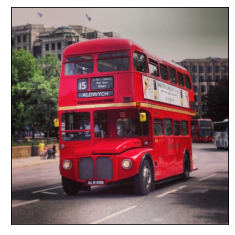

loading annotations into memory...
Done (t=2.73s)
creating index...
index created!


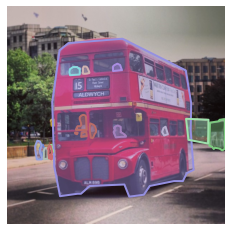

In [16]:
img = cv2.imread('coco/val2017/000000001584.jpg',1)
Cimg = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(Cimg, cmap = 'gray')
plt.xticks([]), plt.yticks([])  # to hide tick values on X and Y axis
plt.show()

dataDir='coco'
dataType='val2017'
annFile='{}/annotations/instances_{}.json'.format(dataDir,dataType)
coco=COCO(annFile)
ids = [10673, 1584]
ids = [1584]
# ids= [10673, 638724, 2162813]
annIds = coco.getAnnIds(imgIds=ids)
anns = coco.loadAnns(annIds)
plt.imshow(Cimg); plt.axis('off')
coco.showAnns(anns)

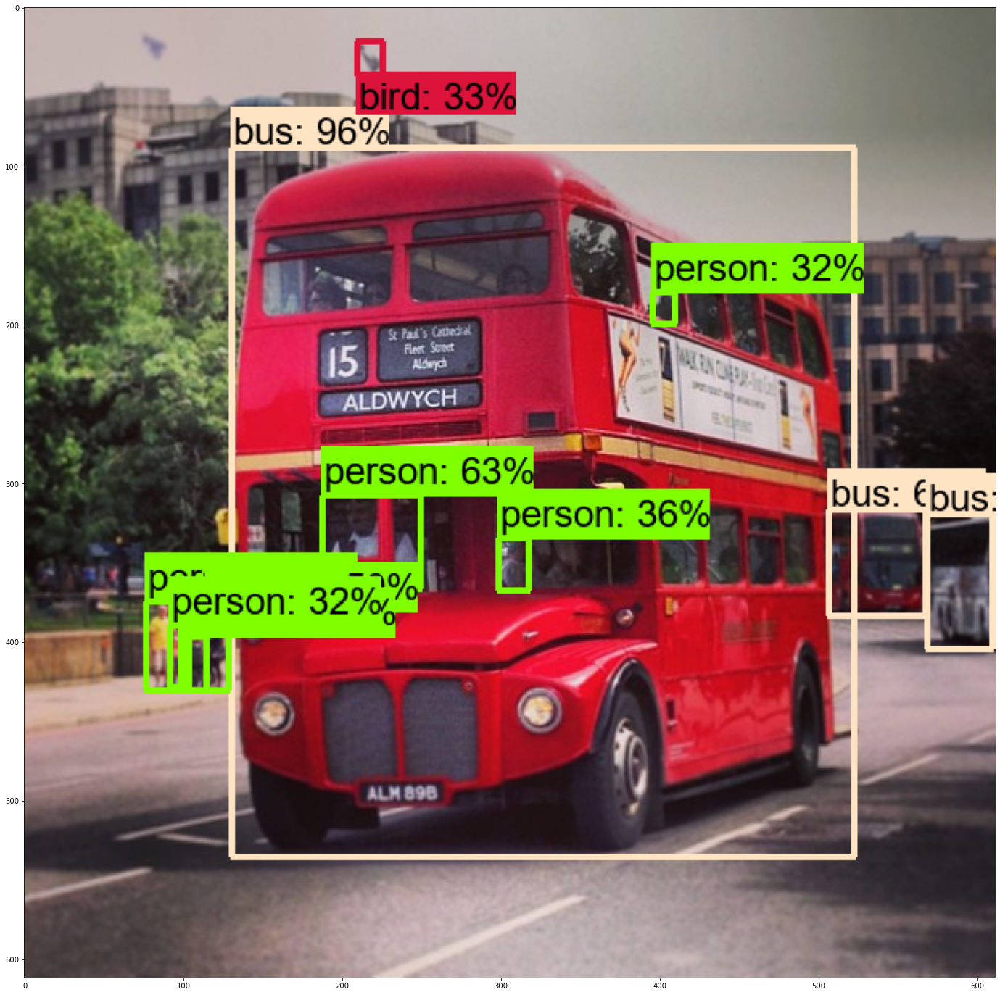

In [17]:
# object_detection = ObjectDetection()
detections = object_detection.inference(Cimg.reshape(1, *Cimg.shape), logging=True)

Test Object Detections, Prune Detections, and Drawing Based on Detections

In [18]:
qd_dataset = QuickDrawDataset()
# drawn_image = qd_dataset.draw(Cimg, "bus")
pruned_detections = qd_dataset.prune_detections(Cimg.shape, detections, threshold=0.5)
print(pruned_detections)
drawn_image = qd_dataset.draw(Cimg, pruned_detections)

[{'class': 'bus', 'bbox': [130.26954674720764, 89.05116426944733, 393.6846785545349, 446.74884939193726]}, {'class': 'bus', 'bbox': [506.44414472579956, 317.1215350627899, 61.949857234954834, 66.80180168151855]}, {'class': 'duck', 'bbox': [76.78649854660034, 375.80409049987793, 22.830202460289, 54.7989935874939]}, {'class': 'duck', 'bbox': [187.11193084716797, 308.396315574646, 63.7366247177124, 57.92209768295288]}, {'class': 'bus', 'bbox': [568.3503377437592, 320.2243938446045, 42.42133712768555, 83.83237838745117]}, {'class': 'duck', 'bbox': [114.1638343334198, 381.20492005348206, 14.956435203552246, 49.42862319946289]}]


TypeError: draw() missing 1 required positional argument: 'save_filename'

Test Drawing using Coco prelabeled Detections

In [ ]:
catIds = coco.getCatIds(catNms=['bus']);
imgIds = coco.getImgIds(catIds=catIds );
imgIds = coco.getImgIds(imgIds = [1584])
img = coco.loadImgs(imgIds[np.random.randint(0,len(imgIds))])[0]
image = io.imread(img['coco_url'])

qd_dataset = QuickDrawDataset()
drawn_image = qd_dataset.draw(image, "bus")

In [41]:
PATH_TO_LABELS = 'models/research/object_detection/data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)
print(category_index.items())
print(category_index[1]['name'])

dict_items([(1, {'id': 1, 'name': 'person'}), (2, {'id': 2, 'name': 'bicycle'}), (3, {'id': 3, 'name': 'car'}), (4, {'id': 4, 'name': 'motorcycle'}), (5, {'id': 5, 'name': 'airplane'}), (6, {'id': 6, 'name': 'bus'}), (7, {'id': 7, 'name': 'train'}), (8, {'id': 8, 'name': 'truck'}), (9, {'id': 9, 'name': 'boat'}), (10, {'id': 10, 'name': 'traffic light'}), (11, {'id': 11, 'name': 'fire hydrant'}), (13, {'id': 13, 'name': 'stop sign'}), (14, {'id': 14, 'name': 'parking meter'}), (15, {'id': 15, 'name': 'bench'}), (16, {'id': 16, 'name': 'bird'}), (17, {'id': 17, 'name': 'cat'}), (18, {'id': 18, 'name': 'dog'}), (19, {'id': 19, 'name': 'horse'}), (20, {'id': 20, 'name': 'sheep'}), (21, {'id': 21, 'name': 'cow'}), (22, {'id': 22, 'name': 'elephant'}), (23, {'id': 23, 'name': 'bear'}), (24, {'id': 24, 'name': 'zebra'}), (25, {'id': 25, 'name': 'giraffe'}), (27, {'id': 27, 'name': 'backpack'}), (28, {'id': 28, 'name': 'umbrella'}), (31, {'id': 31, 'name': 'handbag'}), (32, {'id': 32, 'name':

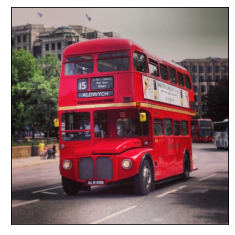

loading annotations into memory...
Done (t=0.59s)
creating index...
index created!


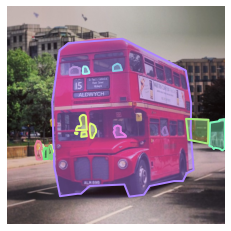

In [19]:
img = cv2.imread('coco/val2017/000000001584.jpg',1)
Cimg = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(Cimg, cmap = 'gray')
plt.xticks([]), plt.yticks([])  # to hide tick values on X and Y axis
plt.show()

dataDir='coco'
dataType='val2017'
annFile='{}/annotations/instances_{}.json'.format(dataDir,dataType)
coco=COCO(annFile)
ids = [10673, 1584]
ids = [1584]
# ids= [10673, 638724, 2162813]
annIds = coco.getAnnIds(imgIds=ids)
anns = coco.loadAnns(annIds)
plt.imshow(Cimg); plt.axis('off')
coco.showAnns(anns)

loading bus drawings
load complete
0
255 width
135
135 height


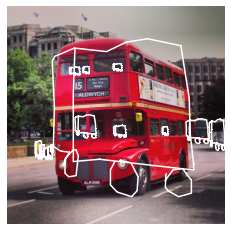

In [20]:
from quickdraw import QuickDrawData
qd = QuickDrawData()
anvil = qd.get_drawing("bus")

I = Cimg
plt.axis('off')

smallest_x = float('inf')
smallest_y = float('inf')
largest_x = 0
largest_y = 0
for stroke in anvil.strokes:
    xarr = []
    yarr = []
#    plt.plot(stroke, marker = 'o')

    for x, y in stroke:
        xarr.append(x)
        yarr.append(y)
        #plt.plot(x, y, marker = ',')
        #print("x={} y={}".format(x, y))
        if(x <= smallest_x):
            smallest_x = x
        if(y <= smallest_y):
            smallest_y = y
        if(x >= largest_x):
            largest_x = x
        if(y >= largest_y):
            largest_y = y
    
#     plt.plot(xarr,yarr, marker = ',', color="white")

width = largest_x-smallest_x
height = largest_y - smallest_y

print(smallest_x)
print(width, 'width')
print(largest_y)
print(height, 'height')

for ann in anns:
    [bbox_x, bbox_y, bbox_w, bbox_h] = ann['bbox']
    for stroke in anvil.strokes:
        xarr = []
        yarr = []
        for x, y in stroke:
            xarr.append(x)
            yarr.append(y)

        newx = [x * (bbox_w/width) + bbox_x for x in xarr]
        newy = [y * (bbox_h/height) + bbox_y for y in yarr]
        plt.plot(newx,newy, marker = ',', color="white")
    #print(bbox_x)

plt.imshow(I)
plt.show()

In [44]:
print(anns)
boxes = {}
for ann in anns:
    boxes[ann['id']] = ann['bbox']
print(boxes)

[{'segmentation': [[126.24, 268.95, 146.83, 123.5, 171.52, 102.91, 323.84, 90.57, 502.22, 179.76, 517.32, 271.7, 515.95, 348.54, 524.18, 459.69, 504.97, 469.29, 493.99, 491.25, 469.29, 491.25, 400.68, 504.97, 384.22, 529.67, 343.05, 535.16, 329.33, 500.85, 231.9, 504.97, 207.2, 526.92, 197.6, 526.92, 148.2, 533.78, 131.73, 450.08]], 'area': 149131.97144999995, 'iscrowd': 0, 'image_id': 1584, 'bbox': [126.24, 90.57, 397.94, 444.59], 'category_id': 6, 'id': 365622}, {'segmentation': [[241.79, 367.72, 246.14, 357.82, 249.31, 354.26, 249.71, 345.95, 245.75, 336.05, 241.79, 332.49, 233.08, 328.93, 231.5, 338.03, 232.29, 353.86, 234.27, 364.55, 234.66, 368.91, 239.41, 370.49], [218.04, 305.97, 212.89, 304.78, 207.75, 307.16, 203.79, 311.51, 203.39, 317.05, 206.96, 327.34, 208.14, 332.09, 207.75, 334.07, 204.19, 336.84, 197.85, 336.84, 195.87, 340.01, 193.1, 345.95, 193.1, 347.53, 223.58, 347.14, 221.21, 309.13], [223.58, 364.95, 207.75, 366.93, 208.94, 354.26, 222.0, 353.07, 223.98, 364.95],